<h1 align="center">UST, Zewail City</h1>
<h2 align="center">CIE 555 (Spring 2021)</h2>
<h2 align="center">Lab 8 : Time Series Forecasting</h2>


Based on Tensorflow and Keras tutorials: 

https://www.tensorflow.org/tutorials/structured_data/time_series 

https://keras.io/examples/timeseries/timeseries_weather_forecasting/

#Lab Objectives

* Explore and process the weather time series data
* Understand the basic operations of RNN models and LSTM cells
* Use RNNs for time series forecasting
* Get introduced to the concept of autoregressive models

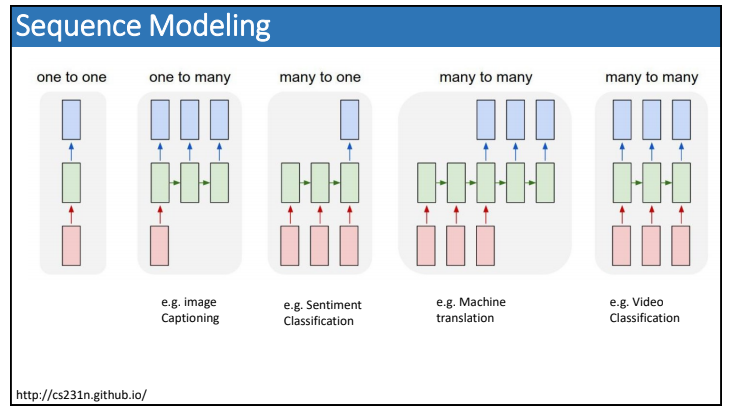

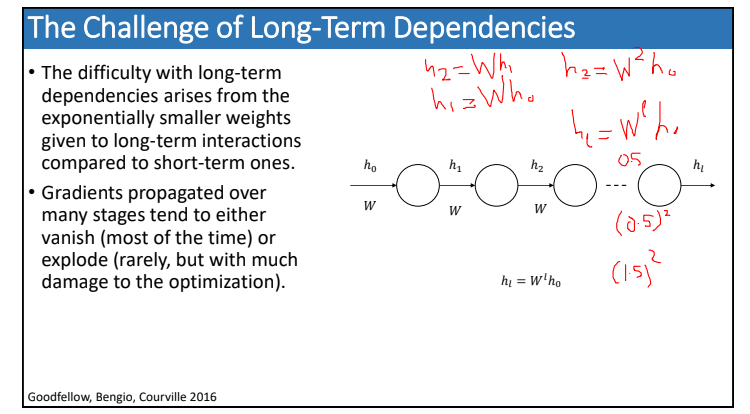

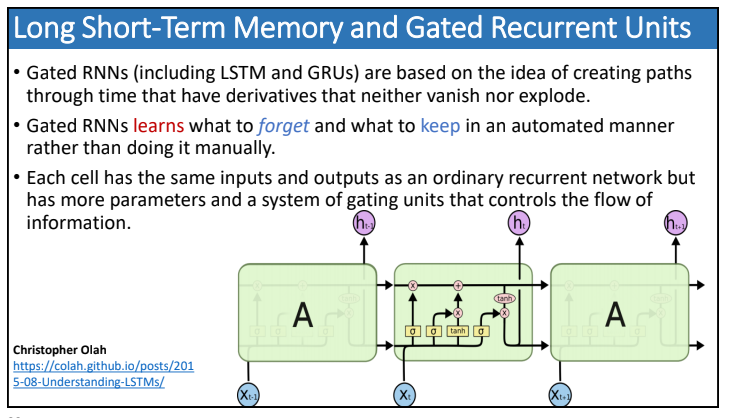

#Installation and Import statements

In [3]:
!pip install pandas-profiling==2.7.1

     |████████████████████████████████| 256kB 29.7MB/s 
     |████████████████████████████████| 1.1MB 40.1MB/s 
     |████████████████████████████████| 61kB 8.7MB/s 
     |████████████████████████████████| 3.1MB 50.3MB/s 
     |████████████████████████████████| 81kB 8.5MB/s 
     |████████████████████████████████| 296kB 53.4MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp37-none-any.whl size=27085 sha256=fcdde3de6c11de3adaaec0bcaece8149a0cdaf00180da8fffb2b41dabd18c007
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
  Created wheel for phik: filename=phik-0.11.2-cp37-none-any.whl size=1107413 sha256=71340573c41e6d4ca68bc9243d2777bd54e9fc3ec3b8c3859abdd1a135eb7ffa
  Stored in directory: /root/.cache/pip/wheels/c0/a3/b0/f27b1cfe32ea131a3715169132ff6d85653789e80e966c3bf6
Successfully built htmlmin phik
ERROR: phik 0.11.2 has requirement scipy>=1.5.2, but you'll have scipy 1.4.1 which is incompatible.
  Found existing i

In [4]:
import os
import datetime

import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import pandas_profiling as pp

from tensorflow import keras

from zipfile import ZipFile

#Dataset

* In this lab we will work with the weather forecasting dataset.
* This dataset contains 14 different features such as air temperature, atmospheric pressure, and humidity. 
* These were collected every 10 minutes, beginning in 2003. 
* We will use only the data collected between 2009 and 2016. 

In [5]:
uri = "https://storage.googleapis.com/tensorflow/tf-keras-datasets/jena_climate_2009_2016.csv.zip"
zip_path = keras.utils.get_file(origin=uri, fname="jena_climate_2009_2016.csv.zip")
zip_file = ZipFile(zip_path)
zip_file.extractall()
csv_path = "jena_climate_2009_2016.csv"

13574144/13568290 [==============================] - 0s 0us/step


In [6]:
df = pd.read_csv(csv_path)
df.head()

,Date Time,p (mbar),T (degC),Tpot (K),Tdew (degC),rh (%),VPmax (mbar),VPact (mbar),VPdef (mbar),sh (g/kg),H2OC (mmol/mol),rho (g/m**3),wv (m/s),max. wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,265.40,-8.90,93.3,3.33,3.11,0.22,1.94,3.12,1307.75,1.03,1.75,152.3
1,01.01.2009 00:20:00,996.57,-8.41,265.01,-9.28,93.4,3.23,3.02,0.21,1.89,3.03,1309.80,0.72,1.50,136.1
2,01.01.2009 00:30:00,996.53,-8.51,264.91,-9.31,93.9,3.21,3.01,0.20,1.88,3.02,1310.24,0.19,0.63,171.6
3,01.01.2009 00:40:00,996.51,-8.31,265.12,-9.07,94.2,3.26,3.07,0.19,1.92,3.08,1309.19,0.34,0.50,198.0
4,01.01.2009 00:50:00,996.51,-8.27,265.15,-9.04,94.1,3.27,3.08,0.19,1.92,3.09,1309.00,0.32,0.63,214.3


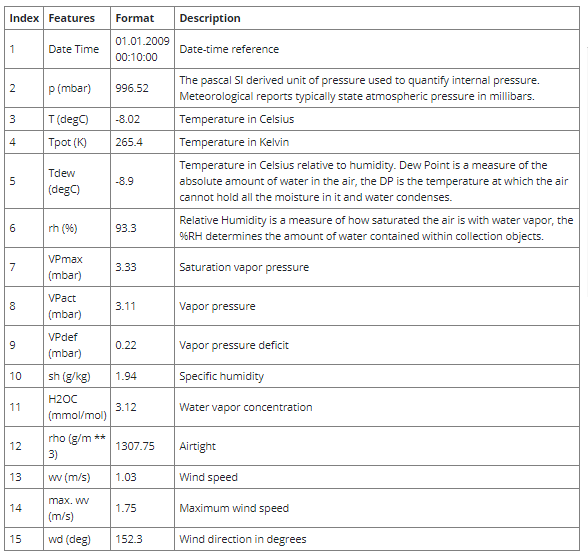

In [7]:
pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#Data Cleaning and Feature Engineering

##Drop some of the highly correlated features

We'll drop the following features: 
* Tpot (K)
* Tdew (degC) 
* rh
* VPact (mbar)
* max. wv (m/s)
* H2OC 

In [8]:
df= df.drop(columns=['Tpot (K)','Tdew (degC)','rh (%)','VPact (mbar)','max. wv (m/s)', 'H2OC (mmol/mol)'])
df.head()

,Date Time,p (mbar),T (degC),VPmax (mbar),VPdef (mbar),sh (g/kg),rho (g/m**3),wv (m/s),wd (deg)
0,01.01.2009 00:10:00,996.52,-8.02,3.33,0.22,1.94,1307.75,1.03,152.3
1,01.01.2009 00:20:00,996.57,-8.41,3.23,0.21,1.89,1309.80,0.72,136.1
2,01.01.2009 00:30:00,996.53,-8.51,3.21,0.20,1.88,1310.24,0.19,171.6
3,01.01.2009 00:40:00,996.51,-8.31,3.26,0.19,1.92,1309.19,0.34,198.0
4,01.01.2009 00:50:00,996.51,-8.27,3.27,0.19,1.92,1309.00,0.32,214.3


In [9]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
p (mbar),420551.0,989.212776,8.358481,913.60,984.20,989.58,994.72,1015.35
T (degC),420551.0,9.450147,8.423365,-23.01,3.36,9.42,15.47,37.28
VPmax (mbar),420551.0,13.576251,7.739020,0.95,7.78,11.82,17.60,63.77
VPdef (mbar),420551.0,4.042412,4.896851,0.00,0.87,2.19,5.30,46.01
sh (g/kg),420551.0,6.022408,2.656139,0.50,3.92,5.59,7.80,18.13
rho (g/m**3),420551.0,1216.062748,39.975208,1059.45,1187.49,1213.79,1242.77,1393.54
wv (m/s),420551.0,1.702224,65.446714,-9999.00,0.99,1.76,2.86,28.49
wd (deg),420551.0,174.743738,86.681693,0.00,124.90,198.10,234.10,360.00


##Wind Velocity Min Value

One thing that should stand out is the min value of the wind velocity, wv (m/s) column. This -9999 is likely erroneous. There's a separate wind direction column, so the velocity should be >=0. Replace it with zeros:

In [10]:
bad_wv = df['wv (m/s)'] == -9999.0
df['wv (m/s)'][bad_wv] = 0.0
df.describe().transpose()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,count,mean,std,min,25%,50%,75%,max
p (mbar),420551.0,989.212776,8.358481,913.60,984.20,989.58,994.72,1015.35
T (degC),420551.0,9.450147,8.423365,-23.01,3.36,9.42,15.47,37.28
VPmax (mbar),420551.0,13.576251,7.739020,0.95,7.78,11.82,17.60,63.77
VPdef (mbar),420551.0,4.042412,4.896851,0.00,0.87,2.19,5.30,46.01
sh (g/kg),420551.0,6.022408,2.656139,0.50,3.92,5.59,7.80,18.13
rho (g/m**3),420551.0,1216.062748,39.975208,1059.45,1187.49,1213.79,1242.77,1393.54
wv (m/s),420551.0,2.130191,1.542334,0.00,0.99,1.76,2.86,28.49
wd (deg),420551.0,174.743738,86.681693,0.00,124.90,198.10,234.10,360.00


##Wind Direction

The last column of the data, wd (deg), gives the wind direction in units of degrees. Angles do not make good model inputs, 360° and 0° should be close to each other, and wrap around smoothly. It will be easier for the model to interpret if you convert the wind direction and velocity columns to a wind vector:
 

In [11]:
wv = df.pop('wv (m/s)')

# Convert to radians.
wd_rad = df.pop('wd (deg)')*np.pi/180

# Calculate the wind x and y components.
df['Wx'] = wv*np.cos(wd_rad)
df['Wy'] = wv*np.sin(wd_rad)
df.head()

,Date Time,p (mbar),T (degC),VPmax (mbar),VPdef (mbar),sh (g/kg),rho (g/m**3),Wx,Wy
0,01.01.2009 00:10:00,996.52,-8.02,3.33,0.22,1.94,1307.75,-0.911955,0.478787
1,01.01.2009 00:20:00,996.57,-8.41,3.23,0.21,1.89,1309.80,-0.518797,0.499249
2,01.01.2009 00:30:00,996.53,-8.51,3.21,0.20,1.88,1310.24,-0.187962,0.027756
3,01.01.2009 00:40:00,996.51,-8.31,3.26,0.19,1.92,1309.19,-0.323359,-0.105066
4,01.01.2009 00:50:00,996.51,-8.27,3.27,0.19,1.92,1309.00,-0.264351,-0.180328


In [12]:
features= df.drop(columns='Date Time')
features.index=df['Date Time']
features.head()

,p (mbar),T (degC),VPmax (mbar),VPdef (mbar),sh (g/kg),rho (g/m**3),Wx,Wy
Date Time,,,,,,,,
01.01.2009 00:10:00,996.52,-8.02,3.33,0.22,1.94,1307.75,-0.911955,0.478787
01.01.2009 00:20:00,996.57,-8.41,3.23,0.21,1.89,1309.80,-0.518797,0.499249
01.01.2009 00:30:00,996.53,-8.51,3.21,0.20,1.88,1310.24,-0.187962,0.027756
01.01.2009 00:40:00,996.51,-8.31,3.26,0.19,1.92,1309.19,-0.323359,-0.105066
01.01.2009 00:50:00,996.51,-8.27,3.27,0.19,1.92,1309.00,-0.264351,-0.180328


##Split the data

* Label column name: ['T (degC)']
 
* Here we are picking ~300,000 data points for training. Observation is recorded every 10 mins, that means 6 times per hour. We will resample one point per hour since no drastic change is expected within 60 minutes. We do this via the sampling_rate argument in timeseries_dataset_from_array utility.

* We are tracking data from past 36 timestamps (36/6=6 hours). This data will be used to predict the temperature after 6 timestamps (6/6=1 hour).

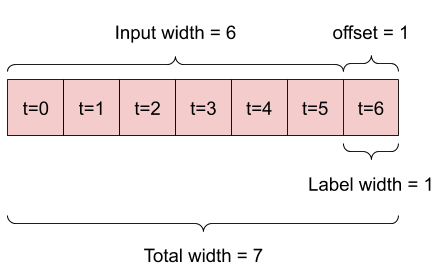

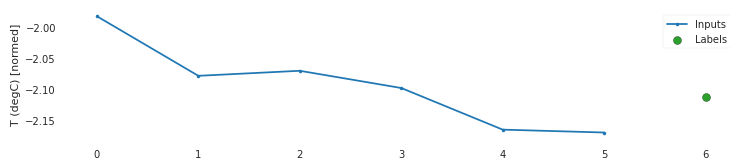

For example, to make a single prediction 24h into the future, given 24h of history you might define a window like this:

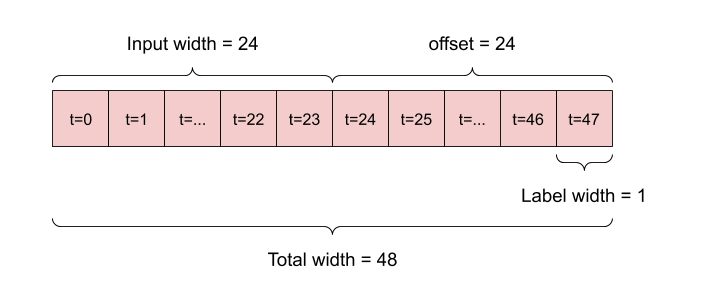

In [13]:
def normalize(data, train_split):
    data_mean = data[:train_split].mean(axis=0)
    data_std = data[:train_split].std(axis=0)
    return (data - data_mean) / data_std

In [14]:
split_fraction = 0.715
train_split = int(split_fraction * int(df.shape[0]))
print("Train split: ", train_split)
step = 6
past = 36
future = 6
learning_rate = 0.001
batch_size = 256
epochs = 10

features = normalize(features.values, train_split)
features = pd.DataFrame(features)
features.head()

Train split:  300693


,0,1,2,3,4,5,6,7
0,0.955451,-2.000020,-1.319782,-0.788479,-1.500927,2.237658,-0.160517,0.560861
1,0.961528,-2.045185,-1.332806,-0.790561,-1.519521,2.287838,0.035423,0.574009
2,0.956666,-2.056766,-1.335410,-0.792642,-1.523239,2.298608,0.200303,0.271053
3,0.954236,-2.033604,-1.328898,-0.794724,-1.508364,2.272906,0.132824,0.185709
4,0.954236,-2.028972,-1.327596,-0.794724,-1.508364,2.268256,0.162232,0.137350


In [15]:
train_data = features.loc[0 : train_split - 1]
val_data = features.loc[train_split:]

print("Train data shape: ", train_data.shape)
print("Validation data shape: ", val_data.shape)

Train data shape:  (300693, 8)
Validation data shape:  (119858, 8)


In [16]:
start = past + future
print("Start= ", start)
end = start + train_split
print("End= ", end)
x_train = train_data.values
print(x_train.shape)
y_train = features.iloc[start:end][[1]]

print(y_train.shape)
sequence_length = int(past / step)
print("Sequence length= ", sequence_length)

Start=  42
End=  300735
(300693, 8)
(300693, 1)
Sequence length=  6


The timeseries_dataset_from_array function takes in a sequence of data-points gathered at equal intervals, along with time series parameters such as length of the sequences/windows, spacing between two sequence/windows, etc., to produce batches of sub-timeseries inputs and targets sampled from the main timeseries.

**tf.keras.preprocessing.timeseries_dataset_from_array(
    data, targets, sequence_length, sampling_rate=1,
    batch_size=128, shuffle=False, seed=None, start_index=None, end_index=None
)**



* data:	Numpy array or eager tensor containing consecutive data points (timesteps). Axis 0 is expected to be the time dimension.
* targets:	Targets corresponding to timesteps in data. It should have same length as data. targets[i] should be the target corresponding to the window that starts at index i 
* sequence_length	Length of the output sequences (in number of timesteps).

In [52]:
dataset_train = keras.preprocessing.timeseries_dataset_from_array(
    x_train,
    y_train,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size,
)

##Validation data

We'll exclude the last 6 hours from the validation data because we don't have a label for them

In [18]:
x_end = len(val_data) - past - future

label_start = train_split + past + future

x_val = val_data.iloc[:x_end].values
y_val = features.iloc[label_start:][[1]]

dataset_val = keras.preprocessing.timeseries_dataset_from_array(
    x_val,
    y_val,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size,
)

In [19]:
for batch in dataset_train.take(1):
    inputs, targets = batch

print("Input shape:", inputs.numpy().shape)
print("Target shape:", targets.numpy().shape)

Input shape: (256, 6, 8)
Target shape: (256, 1)


#Training

In [20]:
inputs = keras.layers.Input(shape=(inputs.shape[1], inputs.shape[2]))
lstm_out = keras.layers.LSTM(32)(inputs)
outputs = keras.layers.Dense(1)(lstm_out)

model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate), loss="mse")
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 6, 8)]            0         
_________________________________________________________________
lstm (LSTM)                  (None, 32)                5248      
_________________________________________________________________
dense (Dense)                (None, 1)                 33        
Total params: 5,281
Trainable params: 5,281
Non-trainable params: 0
_________________________________________________________________


In [21]:
path_checkpoint = "model_checkpoint.h5"
es_callback = keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=5)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint,
    verbose=1,
    save_weights_only=True,
    save_best_only=True,
)

history = model.fit(
    dataset_train,
    epochs=epochs,  
    validation_data=dataset_val,
    callbacks=[es_callback, modelckpt_callback],
)

Epoch 1/10
1175/1175 [==============================] - 77s 38ms/step - loss: 0.1843 - val_loss: 0.0744

Epoch 00001: val_loss improved from inf to 0.07442, saving model to model_checkpoint.h5
Epoch 2/10
1175/1175 [==============================] - 44s 38ms/step - loss: 0.0508 - val_loss: 0.0584

Epoch 00002: val_loss improved from 0.07442 to 0.05841, saving model to model_checkpoint.h5
Epoch 3/10
1175/1175 [==============================] - 45s 38ms/step - loss: 0.0381 - val_loss: 0.0479

Epoch 00003: val_loss improved from 0.05841 to 0.04786, saving model to model_checkpoint.h5
Epoch 4/10
1175/1175 [==============================] - 45s 38ms/step - loss: 0.0315 - val_loss: 0.0429

Epoch 00004: val_loss improved from 0.04786 to 0.04287, saving model to model_checkpoint.h5
Epoch 5/10
1175/1175 [==============================] - 45s 38ms/step - loss: 0.0284 - val_loss: 0.0411

Epoch 00005: val_loss improved from 0.04287 to 0.04107, saving model to model_checkpoint.h5
Epoch 6/10
1175/117

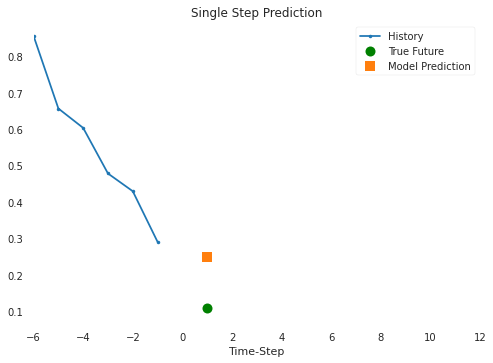

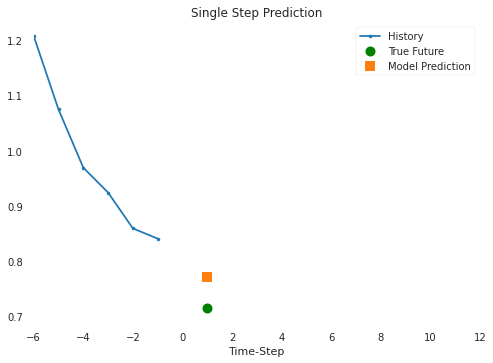

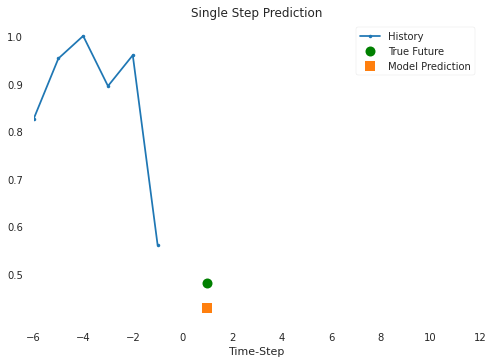

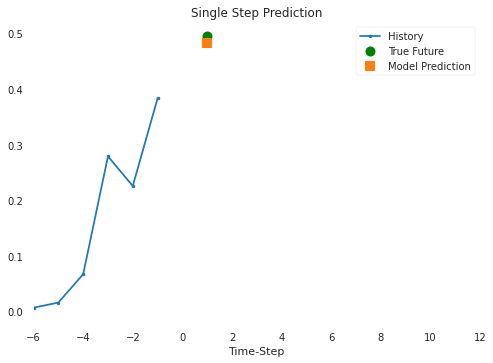

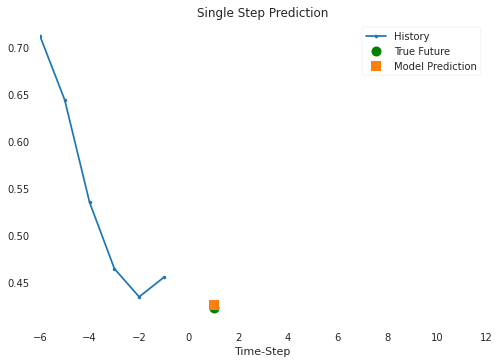

In [22]:
def show_plot(plot_data, delta, title):
    labels = ["History", "True Future", "Model Prediction"]
    marker = [".-", "go", "s"]
    time_steps = list(range(-(plot_data[0].shape[0]), 0))
    
    plt.title(title)
    for i, val in enumerate(plot_data):
      if i:
        plt.plot(delta, plot_data[i], marker[i], markersize=10, label=labels[i])
      else:
        plt.plot(time_steps, plot_data[i].flatten(), marker[i], label=labels[i])
    plt.legend()
    plt.xlim([time_steps[0], (delta + 5) * 2])
    plt.xlabel("Time-Step")
    plt.show()
    return


for x, y in dataset_val.take(5):
    show_plot(
        [x[0][:, 1].numpy(), y[0].numpy(), model.predict(x)[0]],
        1,
        "Single Step Prediction",
    )

#multi-step prediction with Autoregressive models

In a multi-step prediction, the model needs to learn to predict a range of future values. Thus, unlike a single step model, where only a single future point is predicted, a multi-step model predicts a sequence of the future values.

There are two rough approaches to this:

Single shot predictions where the entire time series is predicted at once.
Autoregressive predictions where the model only makes single step predictions and its output is fed back as its input.

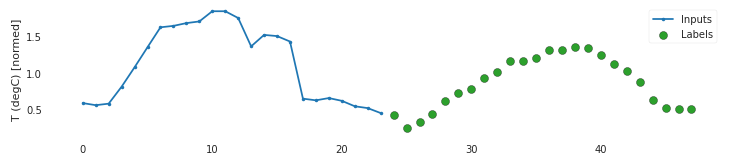

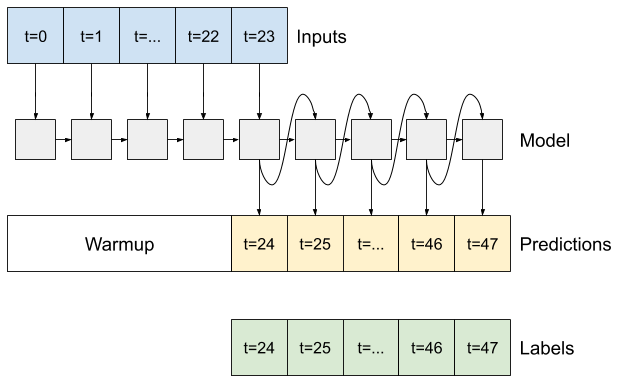

#Task [10 points]

Use two RNN models (one with simple vanilla RNN cells and the other with LSTM cells) to predict the temperature 24 hours into the future given the past 24 hours as illustrated in the below window: 

https://keras.io/api/layers/recurrent_layers/simple_rnn/

https://keras.io/api/layers/recurrent_layers/lstm/

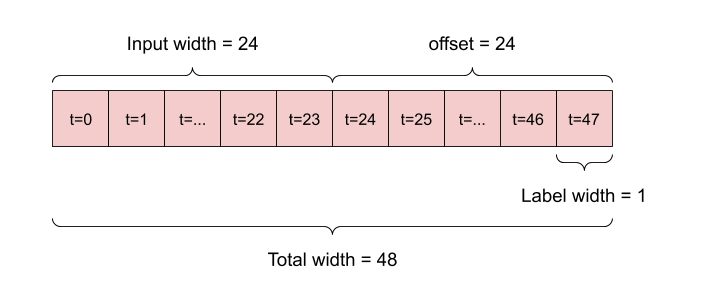

- In this task you're required to split the data into training, validation and test. Use the test set to test the generalization error of your models. 
- Use mean absolute error as an evaluation metric
- Compare the performance of the two models and comment on the results


##Bonus[1 point]
- What does the return_sequences parameter mean in LSTM layer?  

## First we prepare the data

In [47]:
train_test_fraction = 0.8
train_test_split = int(train_test_fraction * int(df.shape[0]))
print("Train Test split: ", train_test_split)

train_val_fraction = 0.7
train_val_split = int(train_test_fraction * train_val_fraction * int(df.shape[0]))
print("Train Validation split: ", train_val_split)

step = 6
past = 6*24
future = 6*24
learning_rate = 0.001
batch_size = 256
epochs = 10

features = normalize(features.values, train_val_split)
features = pd.DataFrame(features)
features.head()

Train Test split:  336440
Train Validation split:  235508


,0,1,2,3,4,5,6,7
0,0.944656,-1.878727,-1.263664,-0.771088,-1.430057,2.102653,-0.159836,0.565577
1,0.950580,-1.923103,-1.276894,-0.773226,-1.448956,2.151615,0.034066,0.578582
2,0.945841,-1.934481,-1.279539,-0.775364,-1.452736,2.162123,0.197230,0.278920
3,0.943471,-1.911724,-1.272925,-0.777502,-1.437617,2.137046,0.130454,0.194504
4,0.943471,-1.907173,-1.271602,-0.777502,-1.437617,2.132508,0.159555,0.146670


In [50]:
train_data = features.loc[0 : train_val_split-1]
val_data = features.loc[train_val_split : train_test_split-1]
test_data = features.loc[train_test_split:]

print("Train data shape: ", train_data.shape)
print("Validation data shape: ", val_data.shape)
print("Test data shape: ", test_data.shape)

Train data shape:  (235508, 8)
Validation data shape:  (100932, 8)
Test data shape:  (84111, 8)


In [51]:
start = past + future
print("Start= ", start)
end = start + train_val_split
print("End= ", end)
x_train = train_data.values
print(x_train.shape)
y_train = features.iloc[start:end][[1]]

print(y_train.shape)
sequence_length = int(past / step)
print("Sequence length= ", sequence_length)

Start=  288
End=  235796
(235508, 8)
(235508, 1)
Sequence length=  24


In [53]:
dataset_train = keras.preprocessing.timeseries_dataset_from_array(
    x_train,
    y_train,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size,
)

In [65]:
x_val = val_data.values
label_start = train_val_split + past + future
y_val = features.iloc[label_start : train_test_split + past + future][[1]]

dataset_val = keras.preprocessing.timeseries_dataset_from_array(
    x_val,
    y_val,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size,
)

In [66]:
x_end = len(test_data) - past - future

label_start = train_test_split + past + future

x_test = test_data.iloc[:x_end].values
y_test = features.iloc[label_start:][[1]]

dataset_test = keras.preprocessing.timeseries_dataset_from_array(
    x_test,
    y_test,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size,
)

In [73]:
for batch in dataset_train.take(1):
    inputs, targets = batch

print("Input shape:", inputs.numpy().shape)
print("Target shape:", targets.numpy().shape)

Input shape: (256, 24, 8)
Target shape: (256, 1)


## Now we build the simple vanilla model

In [74]:
inputs = keras.layers.Input(shape=(inputs.shape[1], inputs.shape[2]))
simple_out = keras.layers.SimpleRNN(32)(inputs)
outputs = keras.layers.Dense(1)(simple_out)

simple_model = keras.Model(inputs=inputs, outputs=outputs)
simple_model.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate), loss="mse")
simple_model.summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 24, 8)]           0         
_________________________________________________________________
simple_rnn_3 (SimpleRNN)     (None, 32)                1312      
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 33        
Total params: 1,345
Trainable params: 1,345
Non-trainable params: 0
_________________________________________________________________


In [75]:
path_checkpoint = "simple_model_checkpoint.h5"
es_callback = keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=5)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint,
    verbose=1,
    save_weights_only=True,
    save_best_only=True,
)

history = simple_model.fit(
    dataset_train,
    epochs=epochs,  
    validation_data=dataset_val,
    callbacks=[es_callback, modelckpt_callback],
)

Epoch 1/10
920/920 [==============================] - 47s 50ms/step - loss: 0.4862 - val_loss: 0.1504

Epoch 00001: val_loss improved from inf to 0.15036, saving model to simple_model_checkpoint.h5
Epoch 2/10
920/920 [==============================] - 47s 51ms/step - loss: 0.1706 - val_loss: 0.1434

Epoch 00002: val_loss improved from 0.15036 to 0.14339, saving model to simple_model_checkpoint.h5
Epoch 3/10
920/920 [==============================] - 46s 50ms/step - loss: 0.1634 - val_loss: 0.1389

Epoch 00003: val_loss improved from 0.14339 to 0.13893, saving model to simple_model_checkpoint.h5
Epoch 4/10
920/920 [==============================] - 47s 51ms/step - loss: 0.1597 - val_loss: 0.1379

Epoch 00004: val_loss improved from 0.13893 to 0.13788, saving model to simple_model_checkpoint.h5
Epoch 5/10
920/920 [==============================] - 47s 51ms/step - loss: 0.1580 - val_loss: 0.1371

Epoch 00005: val_loss improved from 0.13788 to 0.13707, saving model to simple_model_checkpoi

## Now let's test the simple vanilla model

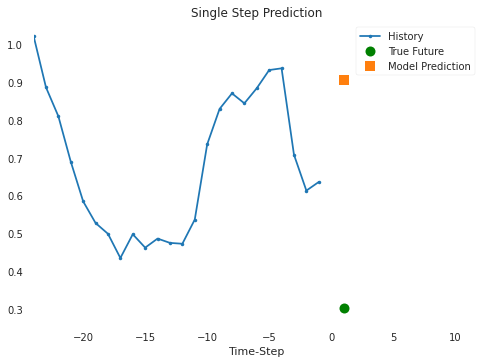

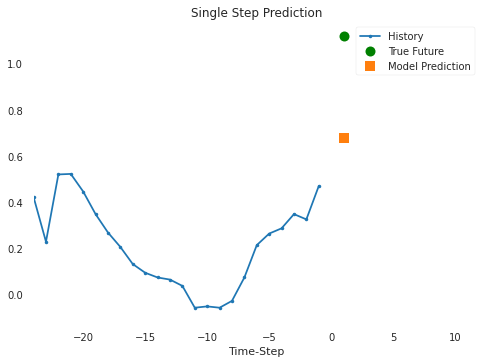

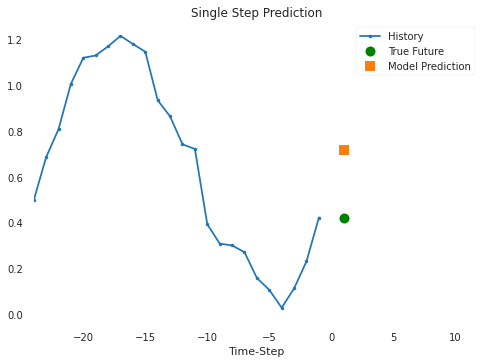

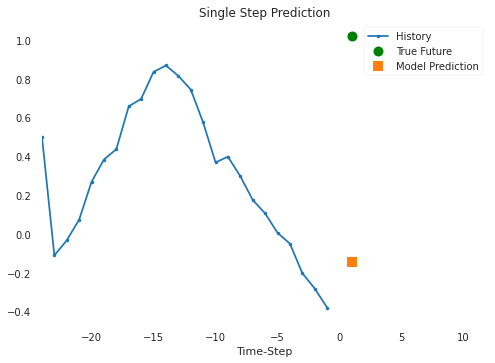

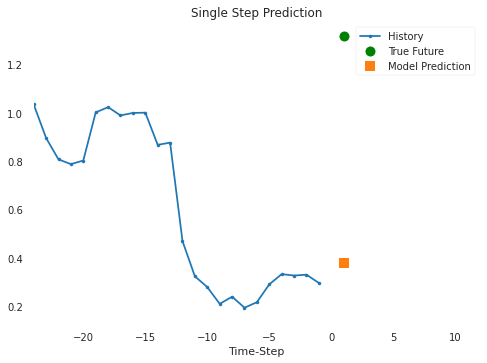

In [86]:
for x, y in dataset_test.take(5):
    show_plot(
        [x[0][:, 1].numpy(), y[0].numpy(), simple_model.predict(x)[0]],
        1,
        "Single Step Prediction",
    )

In [84]:
print("Validation loss = ", simple_model.evaluate(dataset_val, verbose=0))
print("Test loss = ", simple_model.evaluate(dataset_test, verbose=0))

Validation loss =  0.13744547963142395
Test loss =  0.1433769166469574


## Now we will do the same but using a lstm model

In [87]:
inputs = keras.layers.Input(shape=(inputs.shape[1], inputs.shape[2]))
lstm_out = keras.layers.LSTM(32)(inputs)
outputs = keras.layers.Dense(1)(lstm_out)

lstm_model = keras.Model(inputs=inputs, outputs=outputs)
lstm_model.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate), loss="mse")
lstm_model.summary()

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 24, 8)]           0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 32)                5248      
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 33        
Total params: 5,281
Trainable params: 5,281
Non-trainable params: 0
_________________________________________________________________


In [88]:
path_checkpoint = "lstm_model_checkpoint.h5"
es_callback = keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=5)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint,
    verbose=1,
    save_weights_only=True,
    save_best_only=True,
)

history = lstm_model.fit(
    dataset_train,
    epochs=epochs,  
    validation_data=dataset_val,
    callbacks=[es_callback, modelckpt_callback],
)

Epoch 1/10
920/920 [==============================] - 38s 40ms/step - loss: 0.2920 - val_loss: 0.1398

Epoch 00001: val_loss improved from inf to 0.13981, saving model to lstm_model_checkpoint.h5
Epoch 2/10
920/920 [==============================] - 37s 41ms/step - loss: 0.1687 - val_loss: 0.1335

Epoch 00002: val_loss improved from 0.13981 to 0.13349, saving model to lstm_model_checkpoint.h5
Epoch 3/10
920/920 [==============================] - 38s 41ms/step - loss: 0.1585 - val_loss: 0.1315

Epoch 00003: val_loss improved from 0.13349 to 0.13149, saving model to lstm_model_checkpoint.h5
Epoch 4/10
920/920 [==============================] - 38s 41ms/step - loss: 0.1542 - val_loss: 0.1302

Epoch 00004: val_loss improved from 0.13149 to 0.13022, saving model to lstm_model_checkpoint.h5
Epoch 5/10
920/920 [==============================] - 38s 42ms/step - loss: 0.1499 - val_loss: 0.1302

Epoch 00005: val_loss improved from 0.13022 to 0.13021, saving model to lstm_model_checkpoint.h5
Epoc

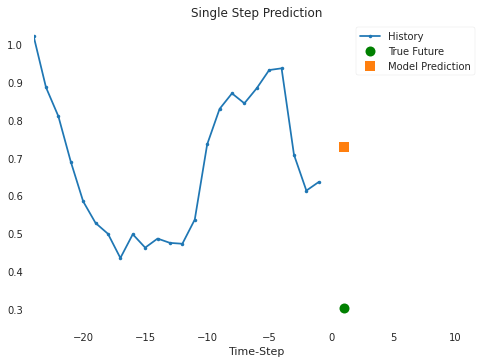

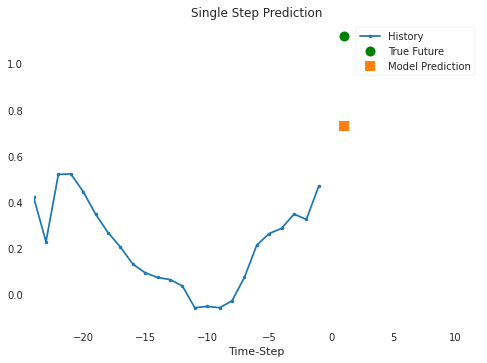

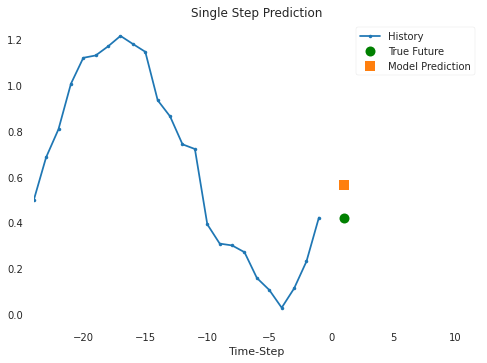

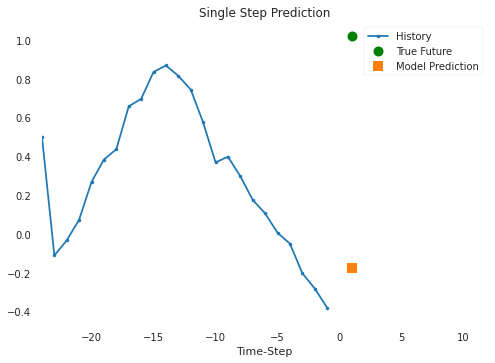

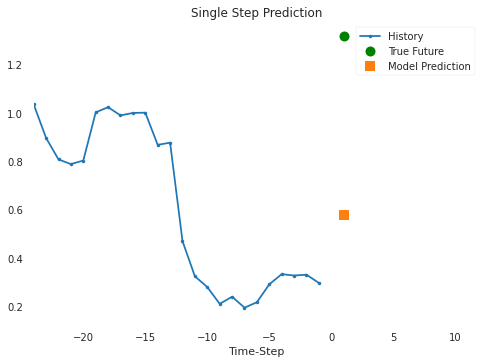

In [89]:
for x, y in dataset_test.take(5):
    show_plot(
        [x[0][:, 1].numpy(), y[0].numpy(), lstm_model.predict(x)[0]],
        1,
        "Single Step Prediction",
    )

In [91]:
print("Validation loss = ", lstm_model.evaluate(dataset_val, verbose=0))
print("Test loss = ", lstm_model.evaluate(dataset_test, verbose=0))

Validation loss =  0.12918072938919067
Test loss =  0.13460779190063477


## Comments:
The LSTM model performed slightly better than the simple vanilla model. The difference is very small, because probably the problems of vanishing/exploding gradients did not show up with this specific dataset.

## Return Sequences parameter:
Return sequence refer to returning the hidden the state of a lstm cell. By default, return_sequences is set to False, so only the output of the lstm cell is returned. However, setting this parameter to true, will cause the hidden values of all the lstm cells to be returned.
This may be useful if we are stacking RNN layers on top of each other, so that the next layer can have the full sequence as input instead of just the final output.